In [1]:
import torch
import numpy as np
import trimesh
import flexicubes
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import plotly.io as pio
pio.renderers.default = 'iframe'
from skimage import measure
import mesh_to_sdf
import trimesh

In [53]:
def render_mesh(verts, faces):
    fig = go.Figure(data=[go.Mesh3d(
        x=verts[:, 0],
        y=verts[:, 1],
        z=verts[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        opacity=0.5,
        colorscale="Jet",
    )])
    fig.show()

def render_static(verts, faces):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    mesh = Poly3DCollection(verts[faces])
    mesh.set_edgecolor('k')
    ax.add_collection3d(mesh)
    plt.tight_layout()
    plt.show()

def render(verts, faces):
    render_static(verts, faces)
    render_mesh(verts, faces)

In [37]:
def cube_sdf(x_nx3):
    sdf_values = 0.5 - torch.abs(x_nx3)
    sdf_values = torch.clamp(sdf_values, min=0.0)
    sdf_values = sdf_values[:, 0] * sdf_values[:, 1] * sdf_values[:, 2]
    sdf_values = -2.0 * sdf_values

    return sdf_values


def cube_sdf_gradient(x_nx3):
    gradients = []
    for i in range(x_nx3.shape[0]):
        x, y, z = x_nx3[i]
        grad_x, grad_y, grad_z = 0, 0, 0

        max_val = max(abs(x) - 0.5, abs(y) - 0.5, abs(z) - 0.5)

        if max_val == abs(x) - 0.5:
            grad_x = 1.0 if x > 0 else -1.0
        if max_val == abs(y) - 0.5:
            grad_y = 1.0 if y > 0 else -1.0
        if max_val == abs(z) - 0.5:
            grad_z = 1.0 if z > 0 else -1.0

        gradients.append(torch.tensor([grad_x, grad_y, grad_z]))

    return torch.stack(gradients).to(x_nx3.device)

In [36]:
res = 5
device='cpu'
fc = flexicubes.FlexiCubes(device)
voxelgrid_vertices, cube_idx = fc.construct_voxel_grid(res)
voxelgrid_vertices *= 1.1
scalar_field = cube_sdf(voxelgrid_vertices)

mesh_with_grad_v, mesh_with_grad_f, something = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res,
    grad_func=cube_sdf_gradient)

mesh_no_grad_v, mesh_no_grad_f, something_no_grad = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res)

tensor([[-0.5500, -0.5500, -0.5500],
        [-0.5500, -0.5500, -0.3300],
        [-0.5500, -0.5500, -0.1100],
        [-0.5500, -0.5500,  0.1100],
        [-0.5500, -0.5500,  0.3300],
        [-0.5500, -0.5500,  0.5500],
        [-0.5500, -0.3300, -0.5500],
        [-0.5500, -0.3300, -0.3300],
        [-0.5500, -0.3300, -0.1100],
        [-0.5500, -0.3300,  0.1100],
        [-0.5500, -0.3300,  0.3300],
        [-0.5500, -0.3300,  0.5500],
        [-0.5500, -0.1100, -0.5500],
        [-0.5500, -0.1100, -0.3300],
        [-0.5500, -0.1100, -0.1100],
        [-0.5500, -0.1100,  0.1100],
        [-0.5500, -0.1100,  0.3300],
        [-0.5500, -0.1100,  0.5500],
        [-0.5500,  0.1100, -0.5500],
        [-0.5500,  0.1100, -0.3300],
        [-0.5500,  0.1100, -0.1100],
        [-0.5500,  0.1100,  0.1100],
        [-0.5500,  0.1100,  0.3300],
        [-0.5500,  0.1100,  0.5500],
        [-0.5500,  0.3300, -0.5500],
        [-0.5500,  0.3300, -0.3300],
        [-0.5500,  0.3300, -0.1100],
 

In [5]:
def flexicubes_to_dense(vertices, scalar_field, resolution):
    xs = np.unique(vertices[:, 0])
    ys = np.unique(vertices[:, 1])
    zs = np.unique(vertices[:, 2])
    nx, ny, nz = len(xs), len(ys), len(zs)

    x_to_i = {x: i for i, x in enumerate(xs)}
    y_to_j = {y: j for j, y in enumerate(ys)}
    z_to_k = {z: k for k, z in enumerate(zs)}

    volume = np.zeros((nx, ny, nz), dtype=np.float32)
    for v, val in zip(vertices, scalar_field):
        i = x_to_i[v[0]]
        j = y_to_j[v[1]]
        k = z_to_k[v[2]]
        volume[i, j, k] = val
    return volume

volume_data = flexicubes_to_dense(
    voxelgrid_vertices.cpu().numpy(),
    scalar_field,
    res
)
volume_data = np.pad(volume_data, 1, mode='constant', constant_values=+1.0)

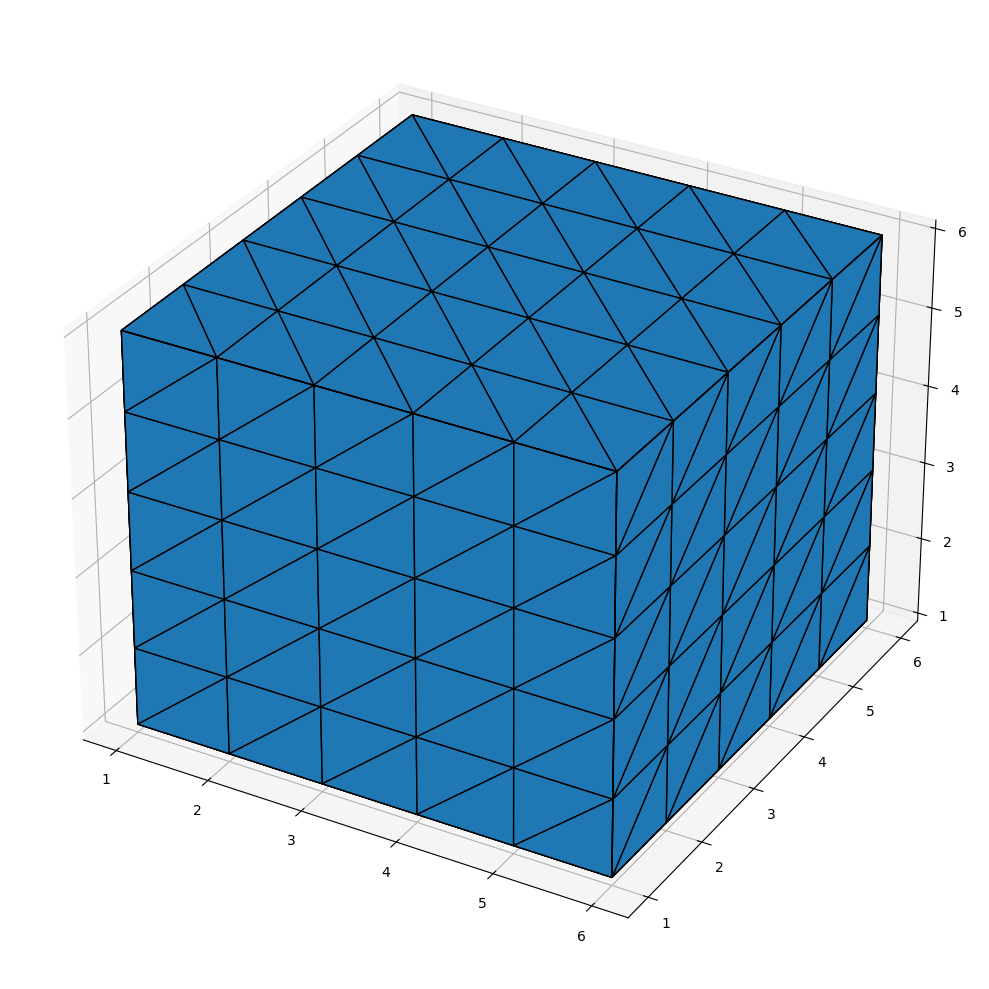

In [6]:
verts, faces, normals, values = measure.marching_cubes(volume_data, 0)
render(verts, faces)

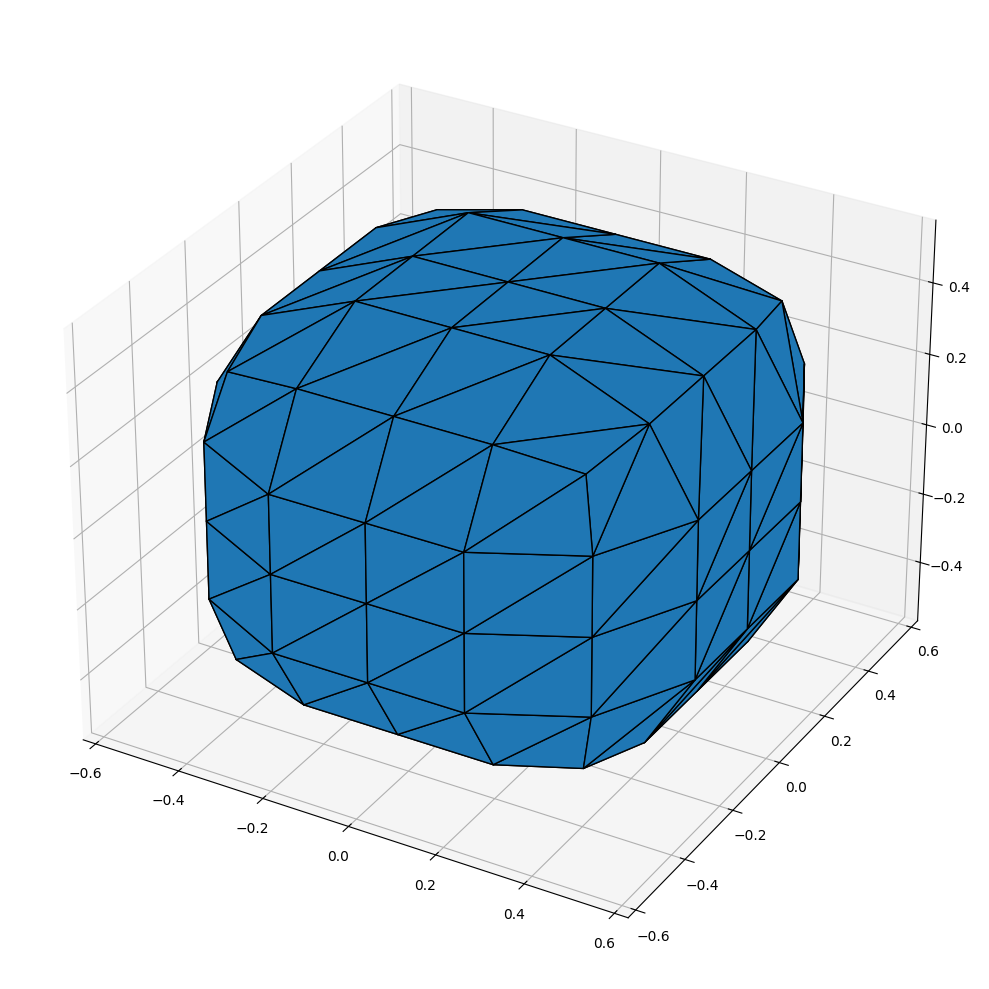

In [7]:
render(mesh_no_grad_v.cpu(), mesh_no_grad_f.cpu())

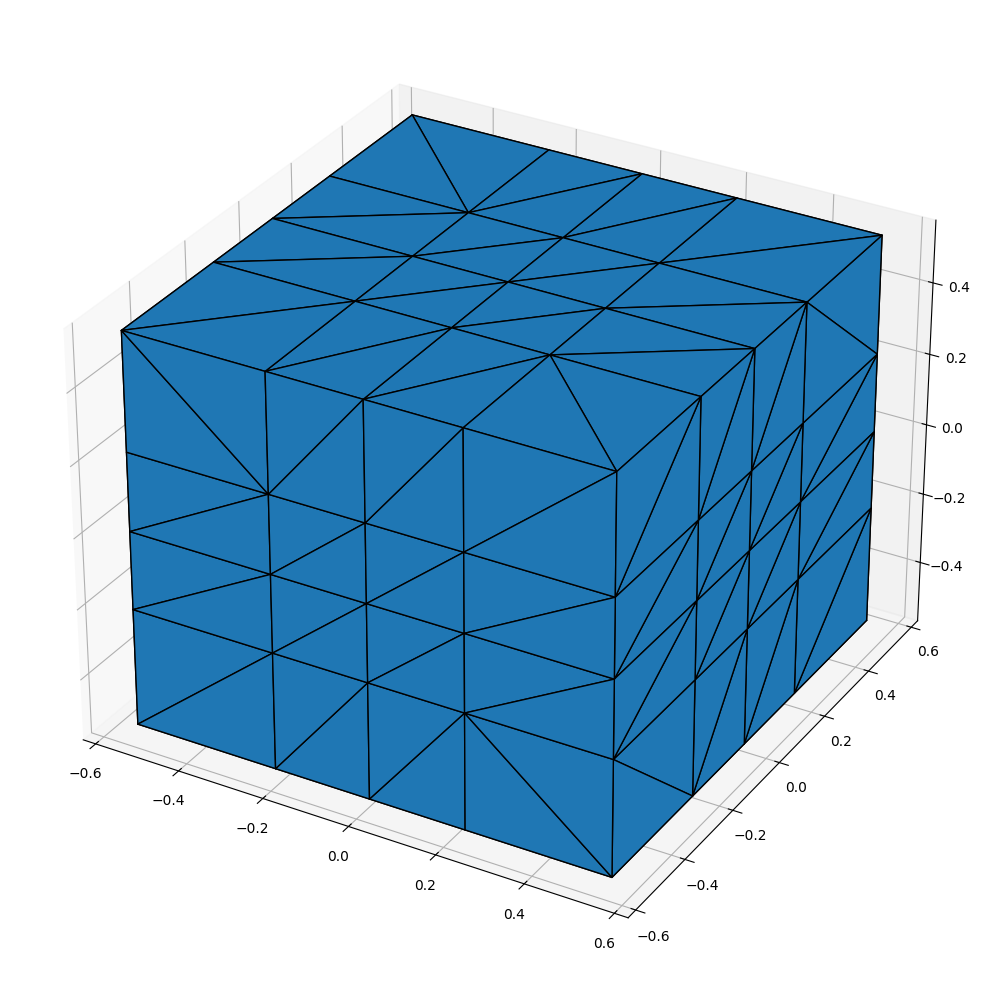

In [8]:
render(mesh_with_grad_v.cpu(), mesh_with_grad_f.cpu())

In [9]:
res = 64

In [10]:
mesh = trimesh.load("./chair.obj")
mesh = mesh_to_sdf.scale_to_unit_cube(mesh)
mesh.apply_translation(-mesh.centroid)
mesh.apply_scale(1.0 / mesh.scale)
point_cloud = mesh_to_sdf.get_surface_point_cloud(
    mesh, surface_point_method='scan', scan_count=20, scan_resolution=400
)
mesh.show()

In [11]:
verts, faces, normals, _ = measure.marching_cubes(
    point_cloud.get_voxels(res, use_depth_buffer=True), 0)

mesh = trimesh.Trimesh(vertices=verts, faces=faces, normals=normals)
mesh.show()

In [12]:
fc = flexicubes.FlexiCubes(device)
voxelgrid_vertices, cube_idx = fc.construct_voxel_grid(res)
scalar_field = torch.Tensor(
    point_cloud.get_sdf(voxelgrid_vertices.cpu().numpy(), use_depth_buffer=True)
).to(device)

v, f, _ = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res
)
trimesh.Trimesh(vertices=v.cpu().numpy(), faces=f.cpu().numpy()).show()

In [13]:
mesh = trimesh.load("./bun_zipper.ply")
mesh = mesh_to_sdf.scale_to_unit_cube(mesh)
mesh.apply_translation(-mesh.centroid)
mesh.apply_scale(1.0 / mesh.scale)
point_cloud = mesh_to_sdf.get_surface_point_cloud(
    mesh, surface_point_method='scan', scan_count=20, scan_resolution=400
)
mesh.show()

In [14]:
verts, faces, normals, _ = measure.marching_cubes(
    point_cloud.get_voxels(res, use_depth_buffer=True), 0)

mesh = trimesh.Trimesh(vertices=verts, faces=faces, normals=normals)
mesh.show()

In [15]:
fc = flexicubes.FlexiCubes(device)
voxelgrid_vertices, cube_idx = fc.construct_voxel_grid(res)
scalar_field = torch.Tensor(
    point_cloud.get_sdf(voxelgrid_vertices.cpu().numpy(), use_depth_buffer=True)
).to(device)

v, f, _ = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res
)
trimesh.Trimesh(vertices=v.cpu().numpy(), faces=f.cpu().numpy()).show()

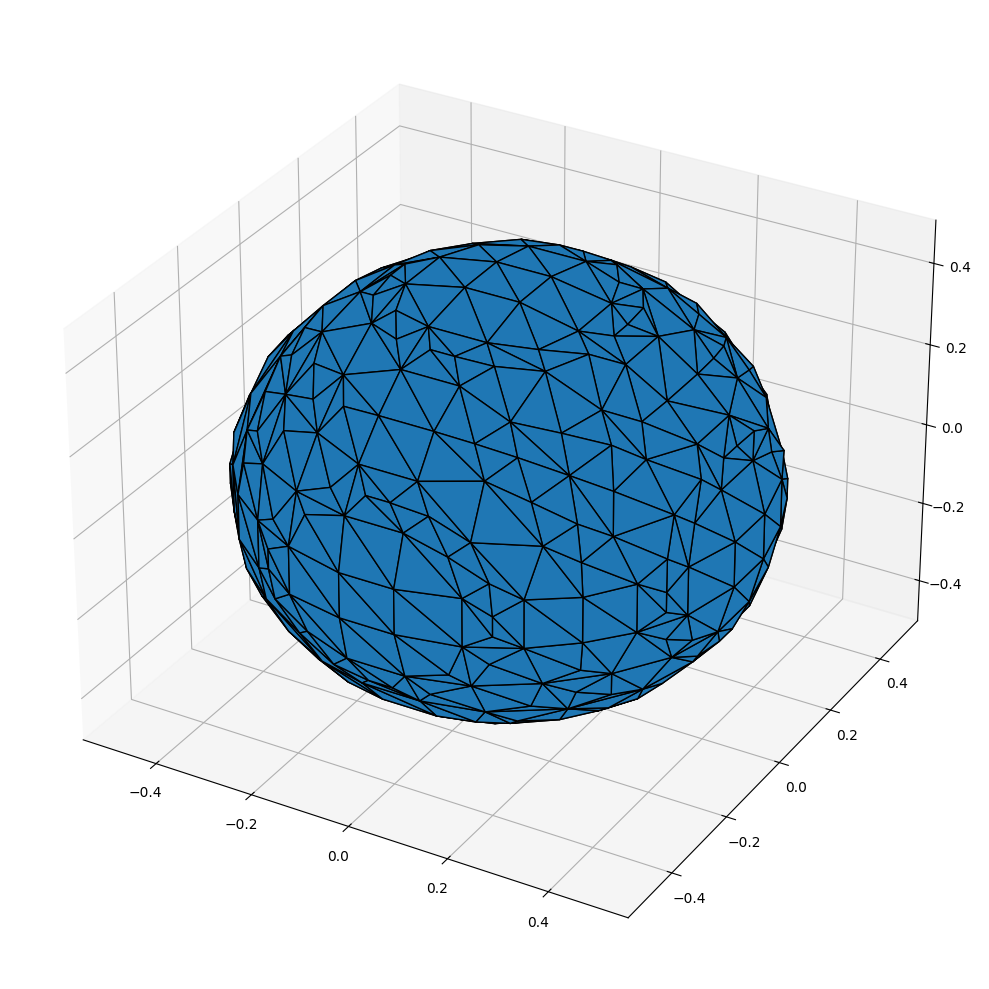

In [54]:
res = 10
device='cpu'
r=0.5
def sphere_sdf(x3):
    return (r**2) - (x3 ** 2).sum(axis=1)

    
fc = flexicubes.FlexiCubes(device)
voxelgrid_vertices, cube_idx = fc.construct_voxel_grid(res)
voxelgrid_vertices *= 1.1
scalar_field = sphere_sdf(voxelgrid_vertices)
mesh_no_grad_v, mesh_no_grad_f, something_no_grad = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res)

render(mesh_no_grad_v.cpu(), mesh_no_grad_f.cpu())

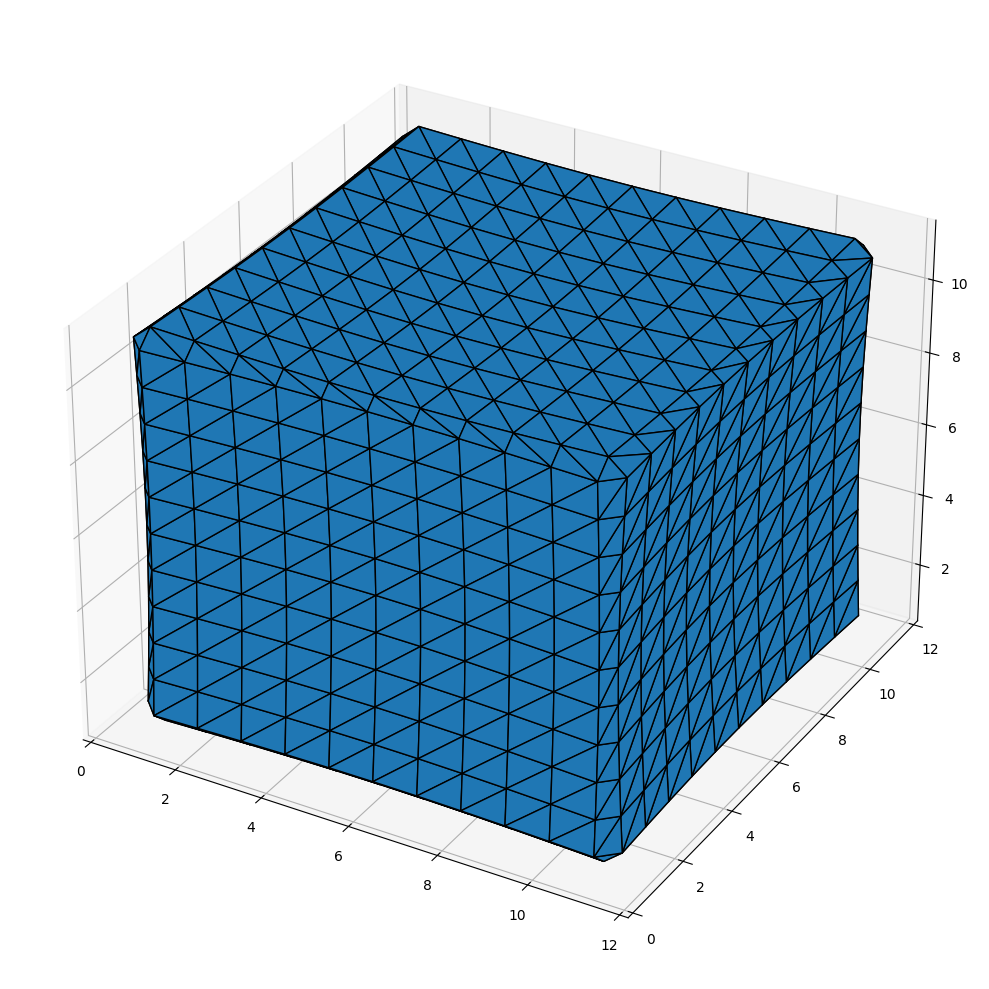

In [55]:
volume_data = flexicubes_to_dense(
    voxelgrid_vertices.cpu().numpy(),
    scalar_field,
    res
)
volume_data = np.pad(volume_data, 1, mode='constant', constant_values=+1.0)
verts, faces, normals, values = measure.marching_cubes(volume_data, 0)
render(verts, faces)

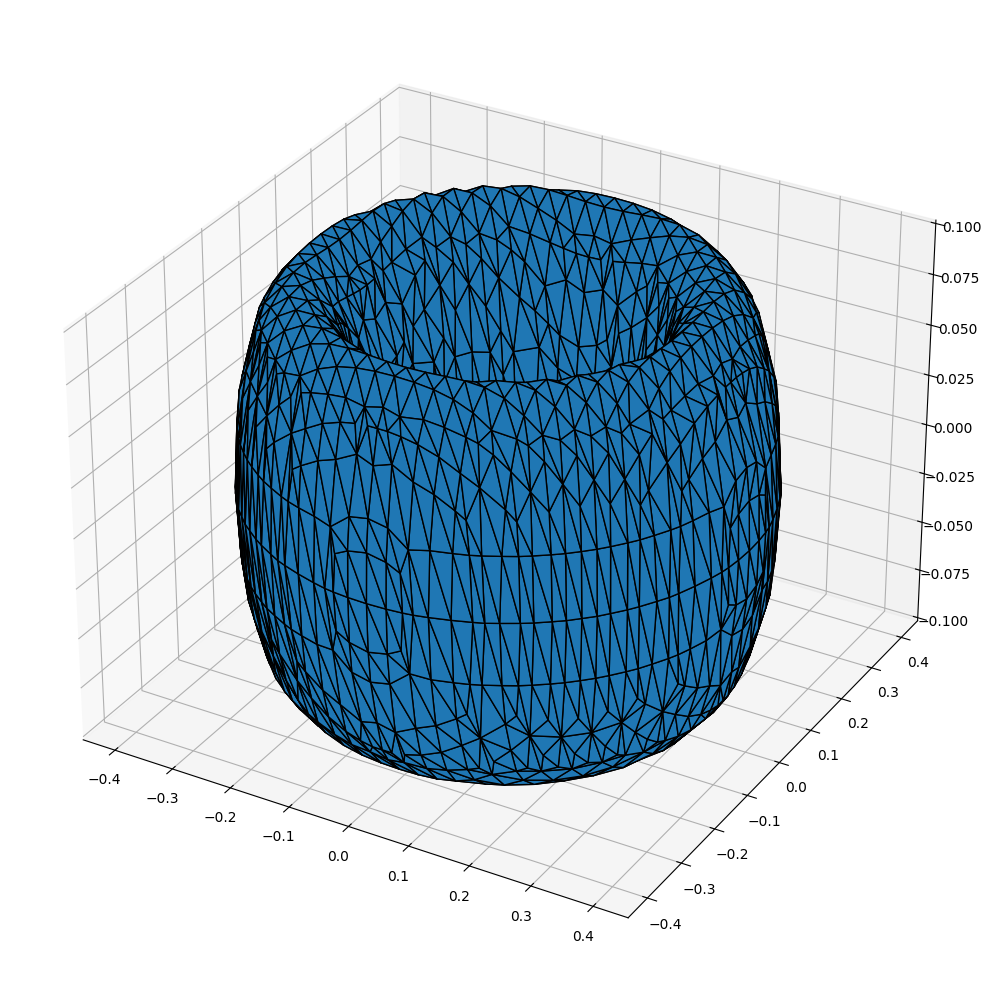

In [89]:
res = 35
device='cpu'
r=0.5
def torus_sdf(x3):
    r = 0.1
    R = 0.3
    x, y, z = voxelgrid_vertices.unbind(axis=1)
    return r**2 - ((x**2 + y**2)**0.5 - R)**2 - z**2

    
fc = flexicubes.FlexiCubes(device)
voxelgrid_vertices, cube_idx = fc.construct_voxel_grid(res)
voxelgrid_vertices *= 1.1
scalar_field = torus_sdf(voxelgrid_vertices)
mesh_no_grad_v, mesh_no_grad_f, something_no_grad = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res)

render(mesh_no_grad_v.cpu(), mesh_no_grad_f.cpu())

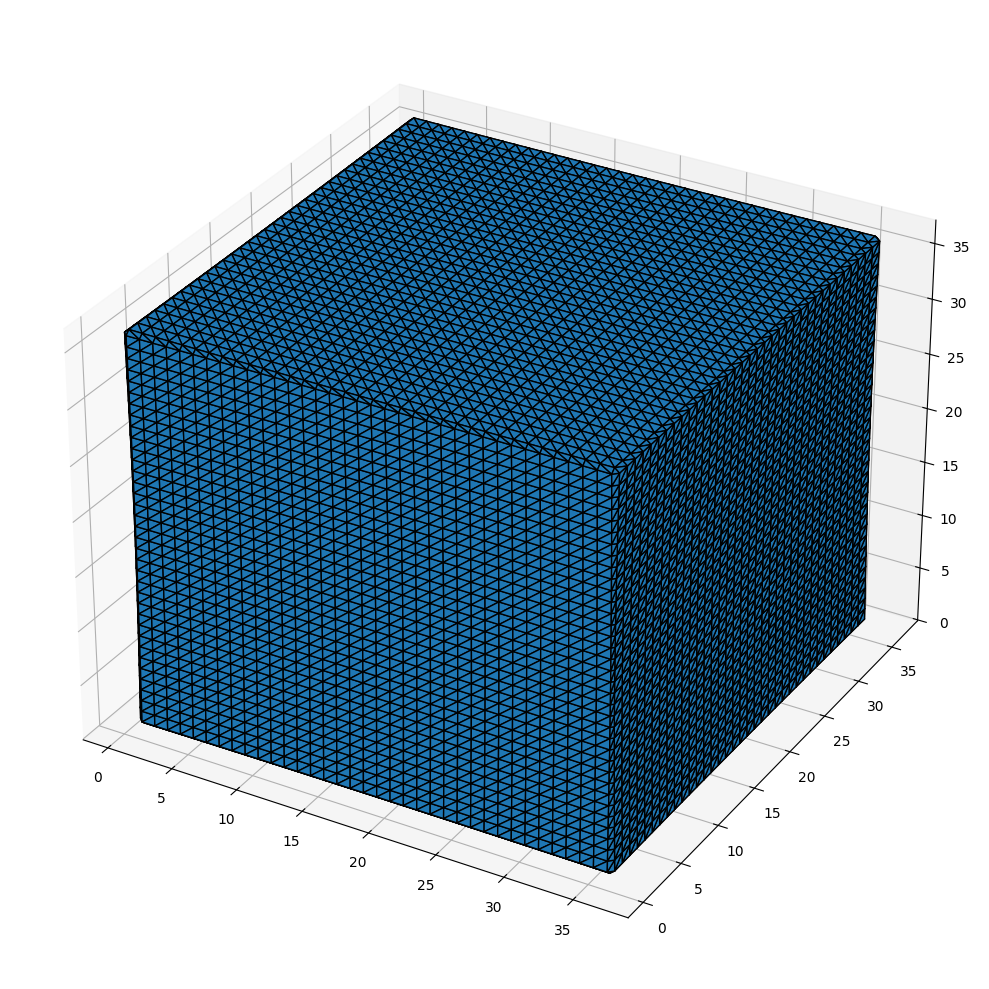

In [81]:
volume_data = flexicubes_to_dense(
    voxelgrid_vertices.cpu().numpy(),
    scalar_field,
    res
)
volume_data = np.pad(volume_data, 1, mode='constant', constant_values=+1.0)
verts, faces, normals, values = measure.marching_cubes(volume_data, 0)
render(verts, faces)

tensor([[ 1.0014,  1.0014,  0.0000],
        [ 1.0014,  1.0014,  0.0000],
        [ 1.0014,  1.0014,  0.0000],
        ...,
        [-1.7643, -0.6199, -0.6676],
        [-1.8716, -0.7033,  0.2265],
        [-1.8716, -0.7033, -0.2265]])
tensor([[ 1.0014,  1.0014,  0.0000],
        [ 1.0014,  1.0014,  0.0000],
        [ 1.0014,  1.0014,  0.0000],
        ...,
        [-1.8239, -0.7272,  0.4292],
        [-1.8477, -0.7629,  0.0000],
        [-1.8358, -0.7391, -0.4292]])


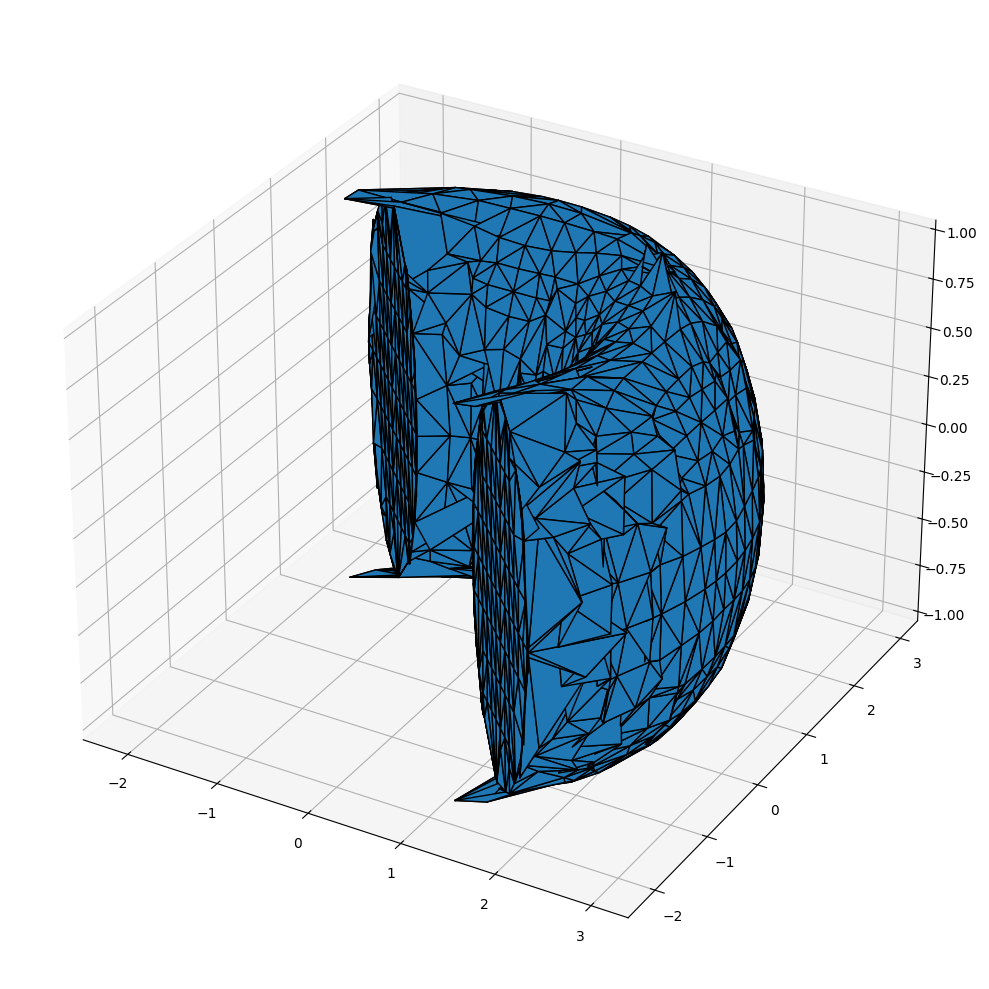

In [147]:
res = 45
device='cpu'
r=0.5
def f(x3):
    r = 1
    R = 2
    x, y, z = x3.unbind(axis=1)
    f1 = r**2 - ((x**2 + y**2)**0.5 - R)**2 - z**2
    f2 = x + y
    f3 = f1 + f2 - (f1**2 + f2**2)**0.5
    return f3

def grad_f(x3):
    h=1e-5
    df_dx = (f(x3.add(torch.tensor([h, 0, 0]))) - f(x3.add(torch.tensor([-h, 0, 0])))) / (2*h)
    df_dy = (f(x3.add(torch.tensor([0, h, 0]))) - f(x3.add(torch.tensor([0, -h, 0])))) / (2*h)
    df_dz = (f(x3.add(torch.tensor([0, 0, h]))) - f(x3.add(torch.tensor([0, 0, -h])))) / (2*h)
    result = torch.stack([df_dx, df_dy, df_dz], axis=1)
    print(result)
    return result
    
fc = flexicubes.FlexiCubes(device)
voxelgrid_vertices, cube_idx = fc.construct_voxel_grid(res)
voxelgrid_vertices *= 10
scalar_field = f(voxelgrid_vertices)
mesh_no_grad_v, mesh_no_grad_f, something_no_grad = fc(
    voxelgrid_vertices, scalar_field, cube_idx, res, grad_func=grad_f)

render(mesh_no_grad_v.cpu(), mesh_no_grad_f.cpu())